In [1]:
import pandas as pd
import matplotlib.pyplot as plt
# from fbprophet import Prophet
from prophet import Prophet

df = pd.read_csv('../data/AirPassengers.csv')

In [2]:
df

,Month,#Passengers
0,1949-01,112
1,1949-02,118
2,1949-03,132
3,1949-04,129
4,1949-05,121
...,...,...
139,1960-08,606
140,1960-09,508
141,1960-10,461
142,1960-11,390


In [ ]:
df['Month'] = pd.to_datetime(df['Month'])
df.columns = ['ds', 'y']

In [4]:
df.head()

# Mothly period data

,ds,y
0,1949-01-01,112
1,1949-02-01,118
2,1949-03-01,132
3,1949-04-01,129
4,1949-05-01,121


10:12:26 - cmdstanpy - INFO - Chain [1] start processing
10:12:27 - cmdstanpy - INFO - Chain [1] done processing


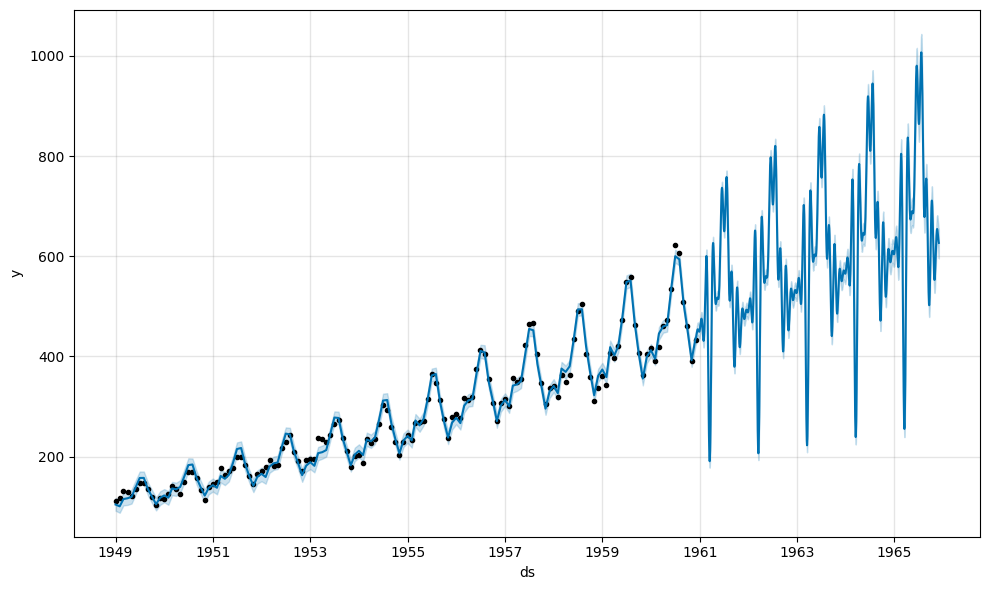

In [5]:
model = Prophet(seasonality_mode='multiplicative')
model.fit(df)

# try daily prediction with monthly period data -> large fluctuation
future = model.make_future_dataframe(periods=365 * 5)
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

10:12:35 - cmdstanpy - INFO - Chain [1] start processing
10:12:35 - cmdstanpy - INFO - Chain [1] done processing


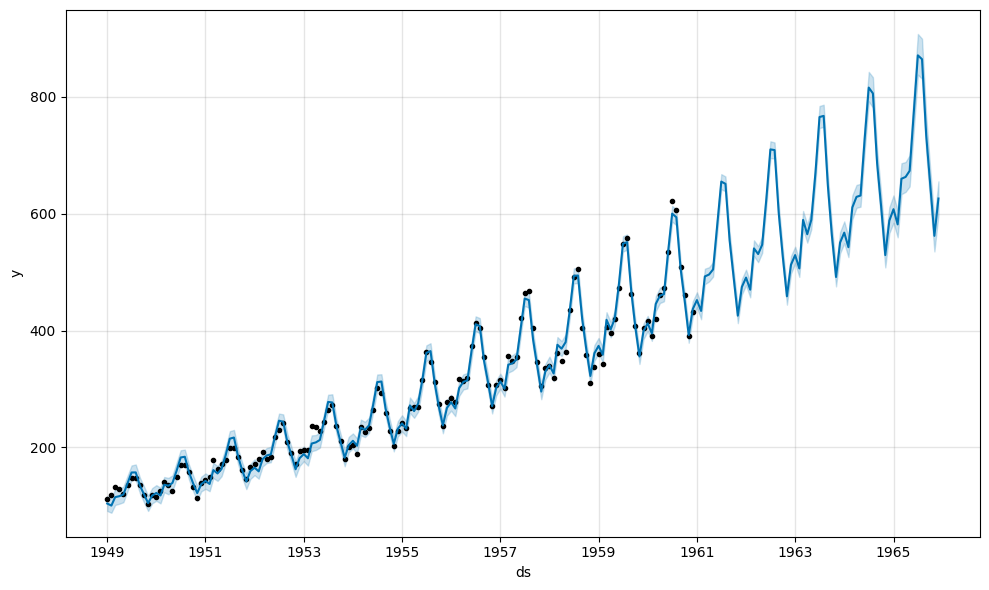

In [6]:
model = Prophet(seasonality_mode='multiplicative')
model.fit(df)

# change to monthly period -> recuded fluctuation
future = model.make_future_dataframe(periods=12 * 5, freq='MS')
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

### Sub-daily data(Houly period)
note : Super-daily data

In [7]:
df = pd.read_csv('../data/divvy_hourly.csv')
df['date'] = pd.to_datetime(df['date'])
df.columns = ['ds', 'y']

In [10]:
df

# houly period

,ds,y
0,2014-01-01 01:00:00,1
1,2014-01-01 02:00:00,9
2,2014-01-01 03:00:00,4
3,2014-01-01 04:00:00,1
4,2014-01-01 07:00:00,2
...,...,...
34711,2017-12-31 20:00:00,10
34712,2017-12-31 21:00:00,9
34713,2017-12-31 22:00:00,3
34714,2017-12-31 23:00:00,8


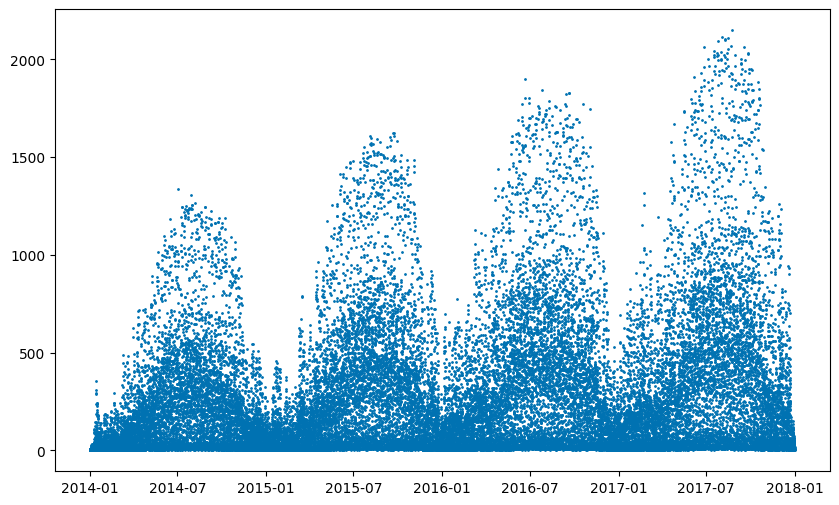

In [11]:
plt.figure(figsize=(10, 6))
plt.scatter(x=df['ds'], y=df['y'], s=1, c='#0072B2')
plt.show()

In [12]:
model = Prophet(seasonality_mode='multiplicative')
model.fit(df)

# set freq
future = model.make_future_dataframe(periods=365 * 24, freq='h')

10:19:22 - cmdstanpy - INFO - Chain [1] start processing
10:19:59 - cmdstanpy - INFO - Chain [1] done processing


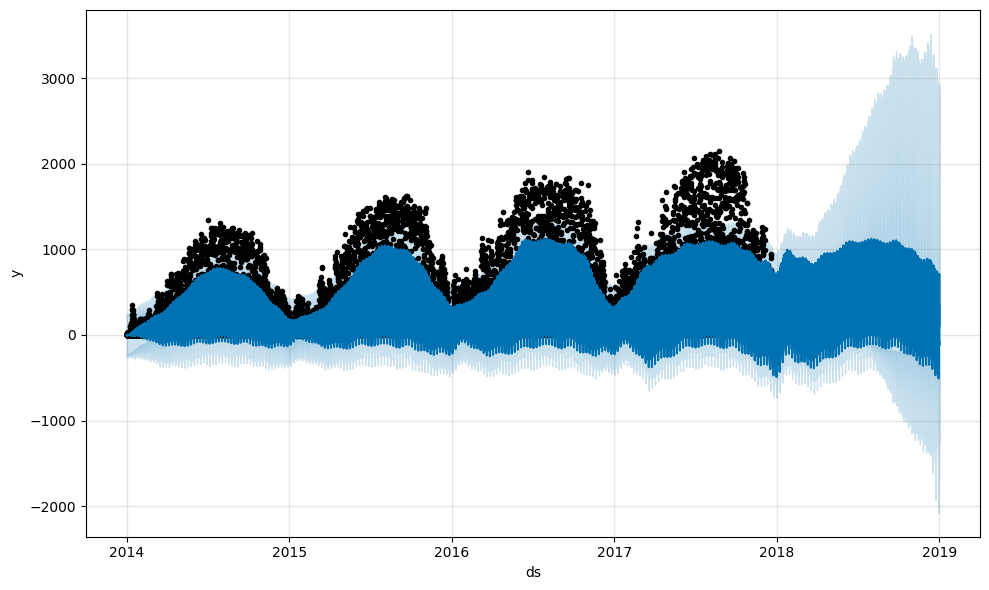

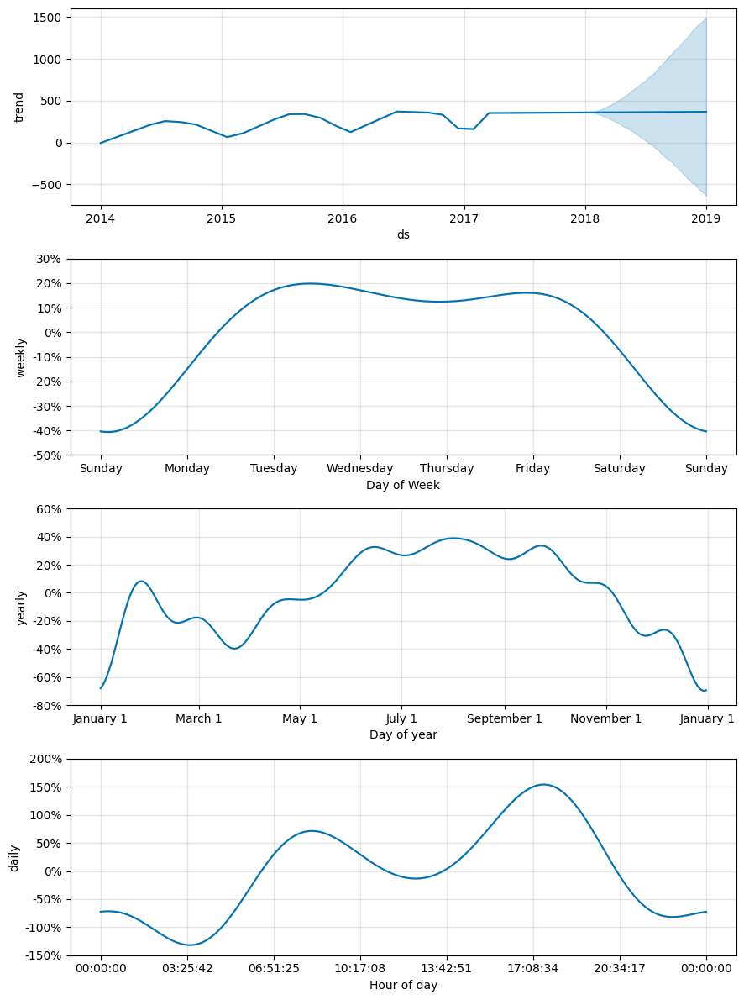

In [13]:
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()
fig2 = model.plot_components(forecast)
plt.show()

## Data with regular gap

In [14]:
# task data between 8:00 ~ 18:00
df = df[(df['ds'].dt.hour >= 8) & (df['ds'].dt.hour < 18)]

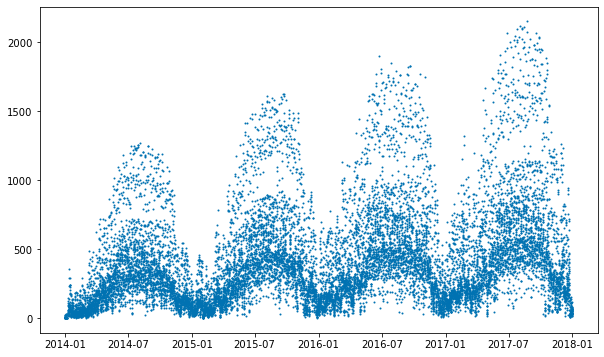

In [10]:
plt.figure(figsize=(10, 6))
plt.scatter(x=df['ds'], y=df['y'], s=1, c='#0072B2')
plt.show()

10:25:46 - cmdstanpy - INFO - Chain [1] start processing
10:26:04 - cmdstanpy - INFO - Chain [1] done processing


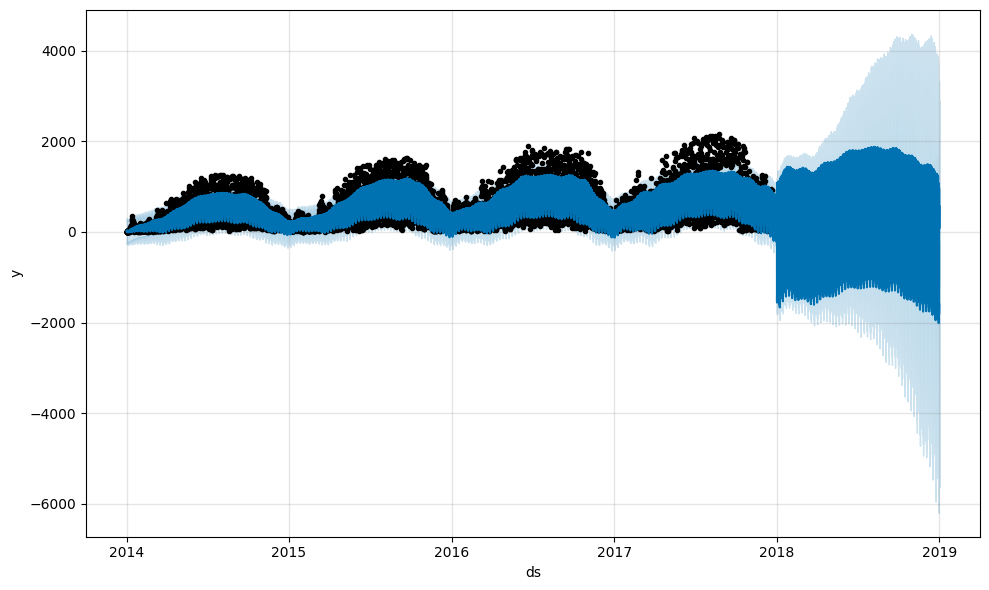

In [15]:
model = Prophet(seasonality_mode='multiplicative')
model.fit(df)
future = model.make_future_dataframe(periods=365 * 24, freq='h')
forecast = model.predict(future)
fig = model.plot(forecast)
plt.show()

## data with regular gap , Prophet shows large fluctuation in prediction

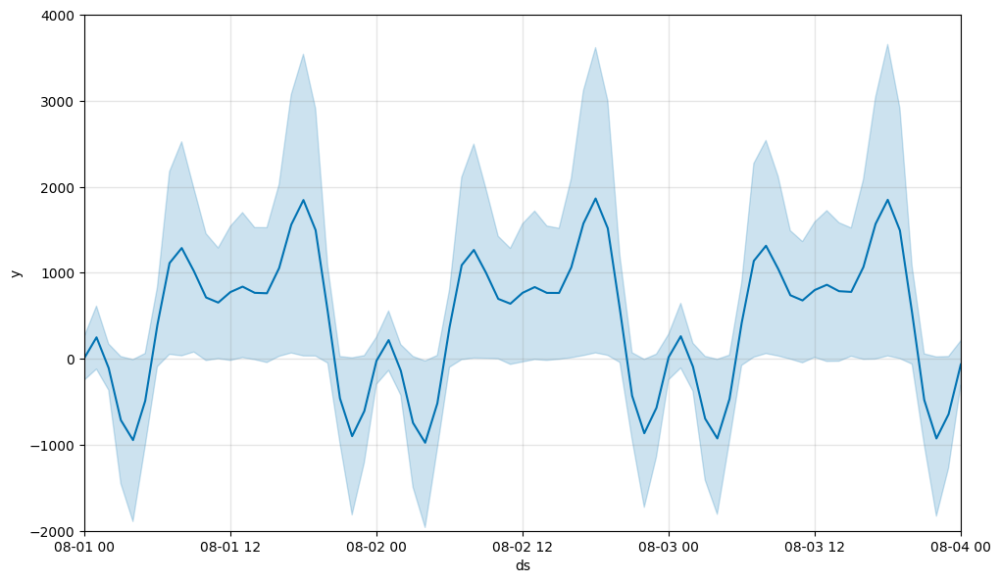

In [16]:
fig = model.plot(forecast)
plt.xlim(pd.to_datetime(['2018-08-01', '2018-08-04']))
plt.ylim(-2000, 4000)
plt.show()

# weired prediction from 18:00 ~ 08:00 , no training data time 

In [18]:
# plotly plot
from prophet.plot import (
    plot_plotly,
    plot_components_plotly,
    plot_forecast_component_plotly,
    plot_seasonality_plotly
)

plot_plotly(model, forecast, trend=False)

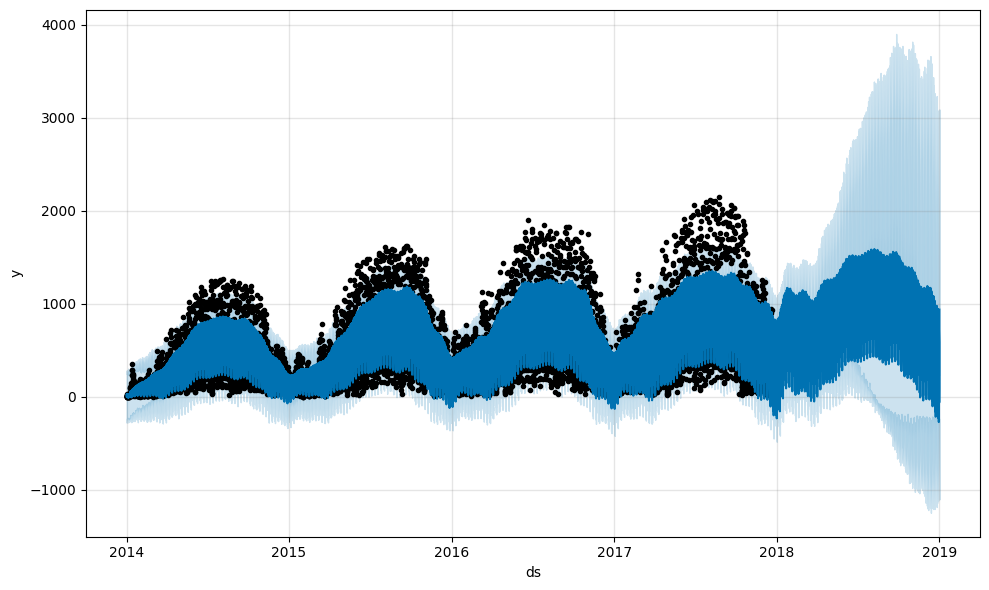

In [19]:
# To handle above problem,
# Select 08:00 ~ 18:00 from future dataframe
# small prediction fluctuation compare to previos plot( but large uncertainty )

future2 = future[(future['ds'].dt.hour >= 8) &
                 (future['ds'].dt.hour < 18)]
forecast2 = model.predict(future2)
fig = model.plot(forecast2)
plt.show()

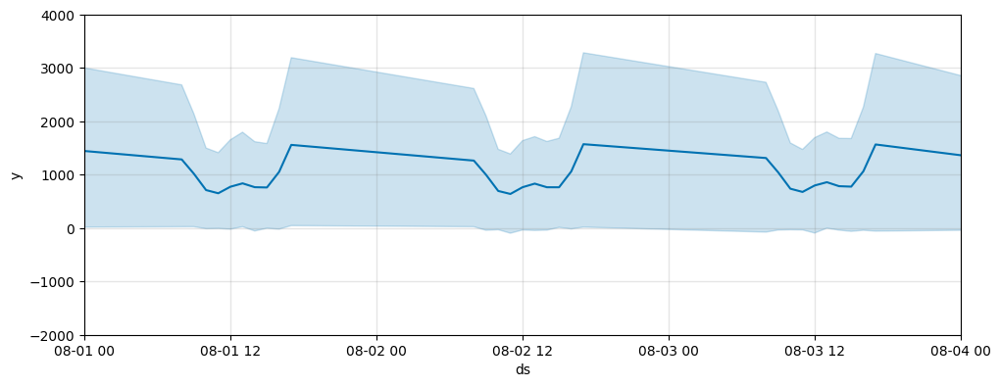

In [20]:
fig = model.plot(forecast2, figsize=(10, 4))
plt.xlim(pd.to_datetime(['2018-08-01', '2018-08-04']))
plt.ylim(-2000, 4000)
plt.show()

## small uncertainty from 08:00 ~ 18:00

## large unciertainty from 18:00 ~ 08:00, actually prophet ignore this times

In [21]:
# plotly plot
plot_plotly(model, forecast2, trend=False)

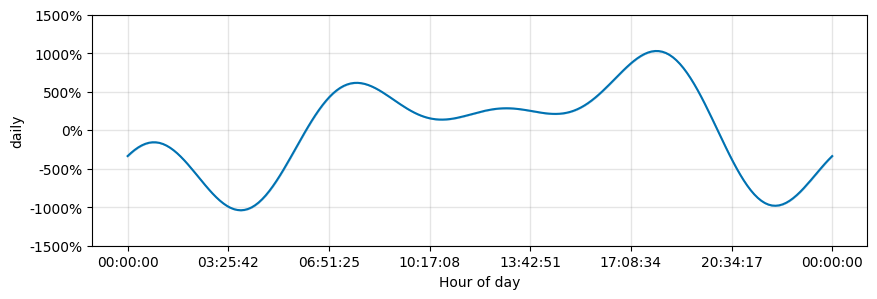

In [22]:
# Daily seasonality
# Two peaks at 08:00, 18:00

# from fbprophet.plot import plot_seasonality
from prophet.plot import plot_seasonality
plot_seasonality(model, 'daily', figsize=(10, 3))
plt.show()

In [23]:
plot_seasonality_plotly(model, 'daily')